In [1]:
import tensorflow as tf

In [2]:
import pathlib
data_dir = pathlib.Path('./photos/')
list_ds = tf.data.Dataset.list_files(str(data_dir/'*/*'))

In [3]:
import IPython.display as display
from PIL import Image

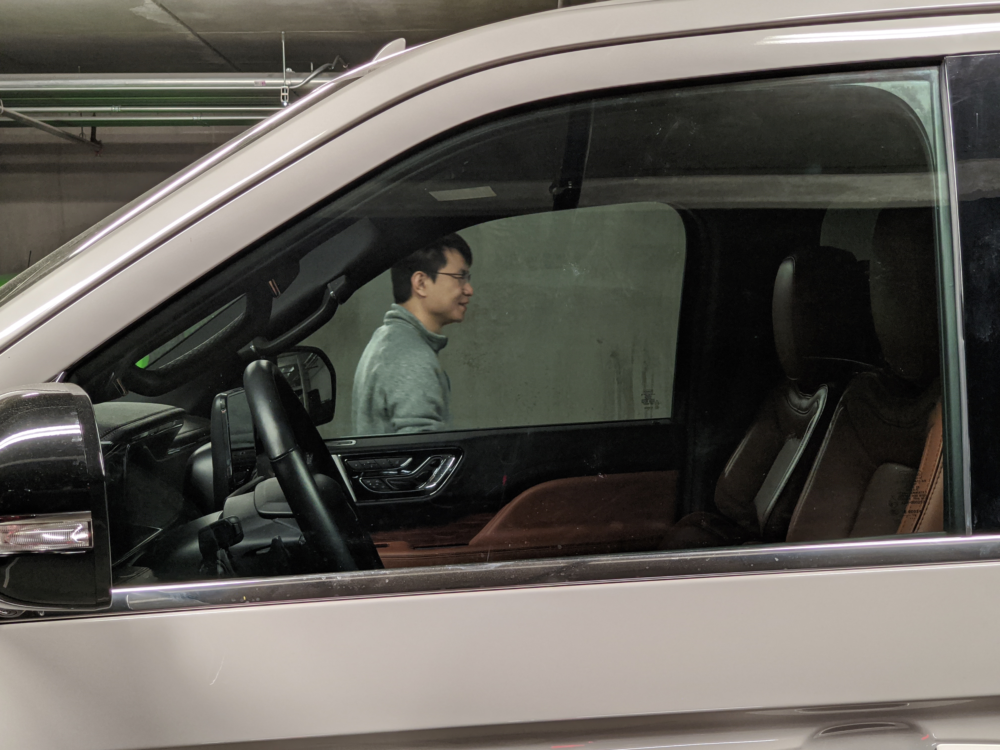

In [13]:
imgs = list(data_dir.glob('original-size-022620-for-test-only/*'))

for image_path in imgs[:1]:
    display.display(Image.open(str(image_path)))

In [18]:
imgs[0]

PosixPath('photos/original-size/IMG_20200225_130912.jpg')

In [22]:
import matplotlib.pyplot as plt

In [14]:
def resize_and_save(img_path):
    if 'jpg' in str(img_path):
        img = tf.io.read_file(str(img_path))
        img = tf.image.decode_jpeg(img)
        img = tf.image.convert_image_dtype(img, tf.float32)
        img = tf.image.resize(img, [1024, 1024])
        img = tf.image.convert_image_dtype(img, tf.uint8)
        img = tf.image.encode_jpeg(img)
        tf.io.write_file(str(img_path).replace('original-size-022620-for-test-only', '1024-1024-022620-for-test-only'), img)

In [15]:
for img_path in imgs:
    resize_and_save(img_path)